In [1]:
from copy import deepcopy

import interfere
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np

COLORS = [str(v) for v in mcolors.TABLEAU_COLORS.values()]
plt.rcParams["figure.dpi"] = 150



# All Dynamic Models in the Interfere Package

The following cells display the variety of dynamics that can be simulated under
the influence of interventions using the `interfere` package.

In [2]:
all_params = [] 

In [3]:
def plot_helper(params, noise_params):
    """Plots the model and the change in response to intervention.
    """

    Xs, X_dos = interfere.generate_counterfactual_dynamics(**params)
    Xs_noise, X_dos_noise = interfere.generate_counterfactual_dynamics(
        **noise_params)

    t = params["time_points_iter"][0]

    dims = Xs[0].shape[1]
    fig, ax = plt.subplots(dims, 2, figsize=(7, 10))
    for i in range(dims):
        ax[i, 0].plot(t, Xs[0][:, i], alpha=0.7, c=COLORS[0])
        ax[i, 0].plot(t, X_dos[0][:, i], alpha=0.7, c=COLORS[3])

    for i in range(dims):
        ax[i, 1].plot(t, Xs_noise[0][:, i], alpha=0.7, c=COLORS[0])
        ax[i, 1].plot(t, X_dos_noise[0][:, i], alpha=0.7, c=COLORS[3])

    ax[-1, -1].plot([0, 0], [0, 0], alpha=0.7, c=COLORS[0], label="Observed Signals")
    ax[-1, -1].plot([0, 0], [0, 0], alpha=0.7, c=COLORS[3], label="Response to Intervention")

    plt.legend(loc=(0.2, -.5))
    plt.suptitle(params["model_type"].__name__ + "\n\nMeasurement noise (left) v.s. Stocastic and measurement noise (right)")
    plt.tight_layout()
    plt.show()

### Arithmetic Brownian Motion

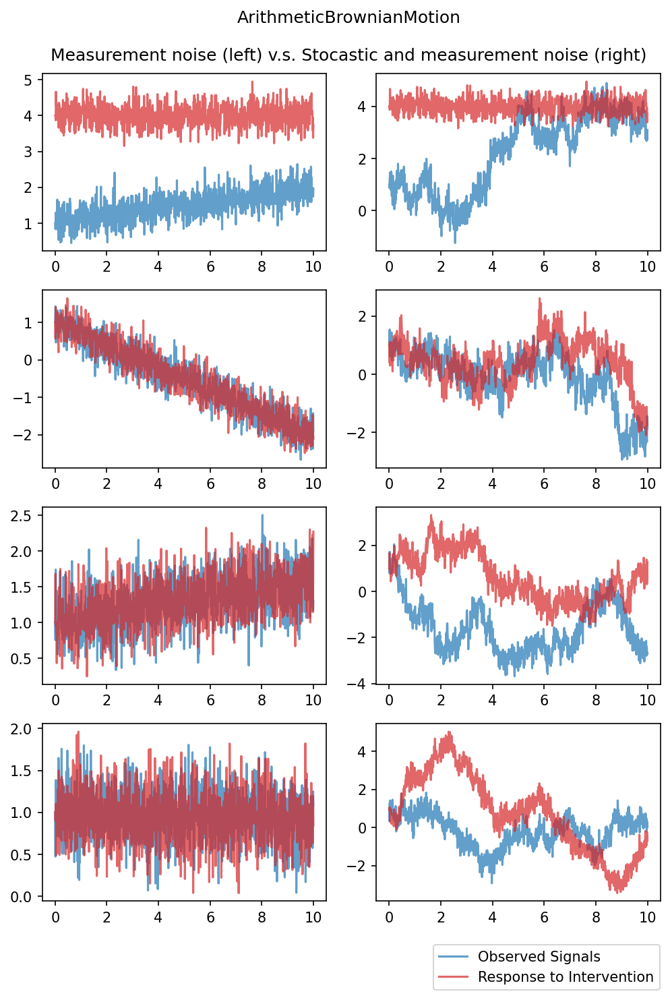

In [4]:
params = dict(
    model_type=interfere.dynamics.ArithmeticBrownianMotion,
    model_params={
        "mu": np.array([0.1, -0.3, 0.06, -0.01]), 
        "sigma": np.array([0, 0, 0, 0]),
        "measurement_noise_std": 0.3 * np.ones(4)
    },
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 4.0},
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 1000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = np.ones(4)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Attracting Fixed Point 4D

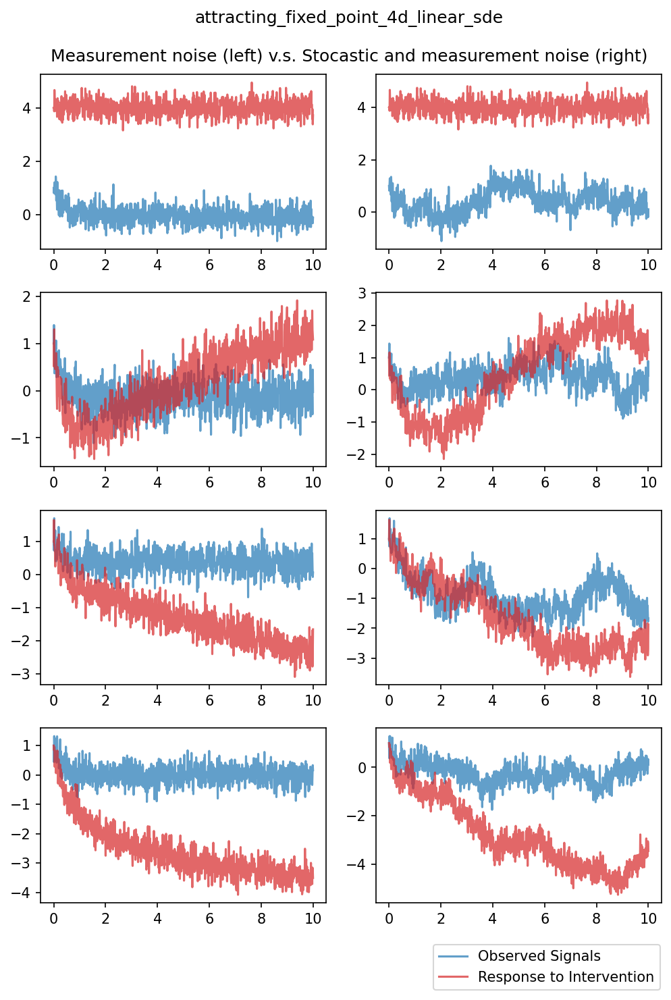

In [5]:
params = dict(
    model_type=interfere.dynamics.attracting_fixed_point_4d_linear_sde,
    model_params={"sigma": 0.0, "measurement_noise_std": 0.3 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 4.0},
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 1000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Belozyorov 3D Quadratic SDE

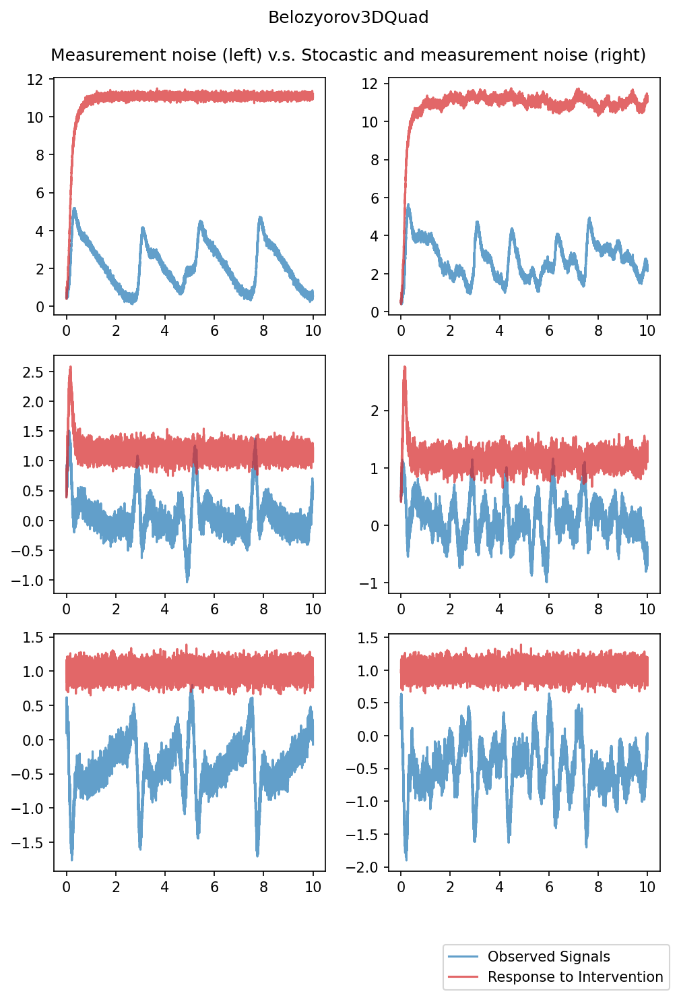

In [6]:
params = dict(
    model_type=interfere.dynamics.Belozyorov3DQuad,
    model_params={
        "mu": 1.81,
        "sigma": 0.0,
        "measurement_noise_std": 0.1 * np.ones(3)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 2, "constants": 1.0},
    initial_condition_iter=[0.5 * np.ones(3)],
    time_points_iter=[np.linspace(0, 10, 10000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

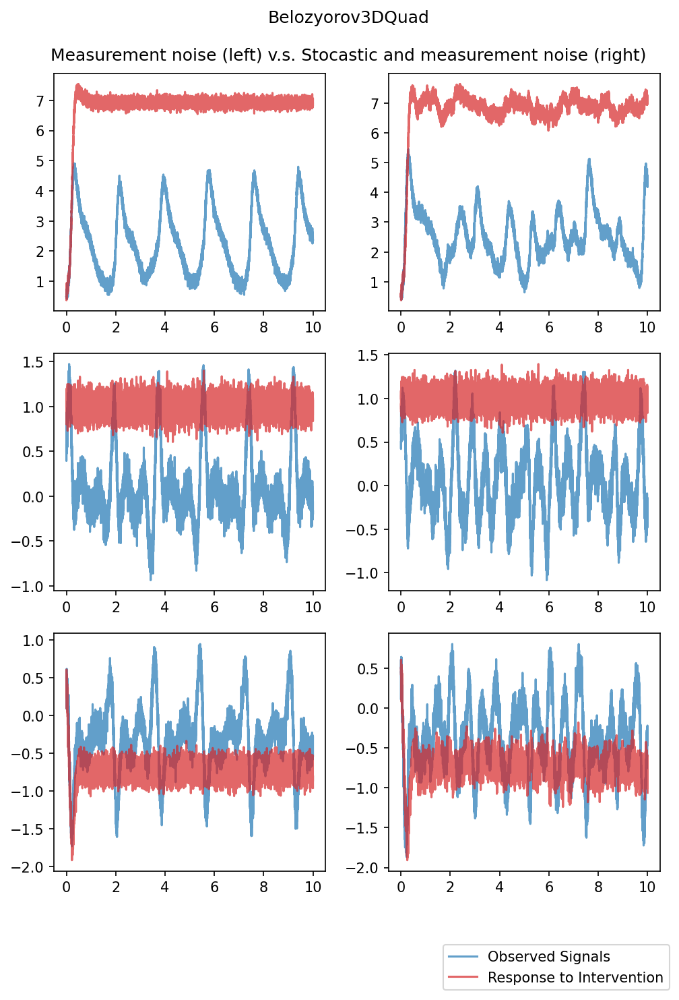

In [7]:
params = dict(
    model_type=interfere.dynamics.Belozyorov3DQuad,
    model_params={
        "mu": 1.4,
        "sigma": 0.0,
        "measurement_noise_std": 0.1 * np.ones(3)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 1, "constants": 1.0},
    initial_condition_iter=[0.5 * np.ones(3)],
    time_points_iter=[np.linspace(0, 10, 10000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

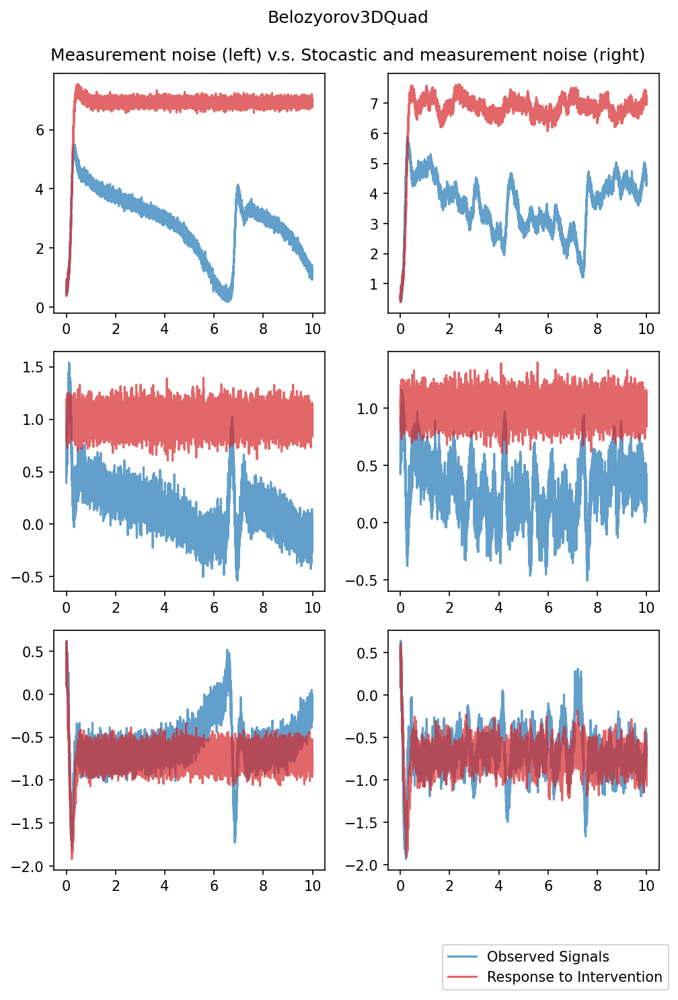

In [8]:
params = dict(
    model_type=interfere.dynamics.Belozyorov3DQuad,
    model_params={
        "mu": 2.2,
        "sigma": 0.0,
        "measurement_noise_std": 0.1 * np.ones(3)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 1, "constants": 1.0},
    initial_condition_iter=[0.5 * np.ones(3)],
    time_points_iter=[np.linspace(0, 10, 10000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Coupled logistic maps

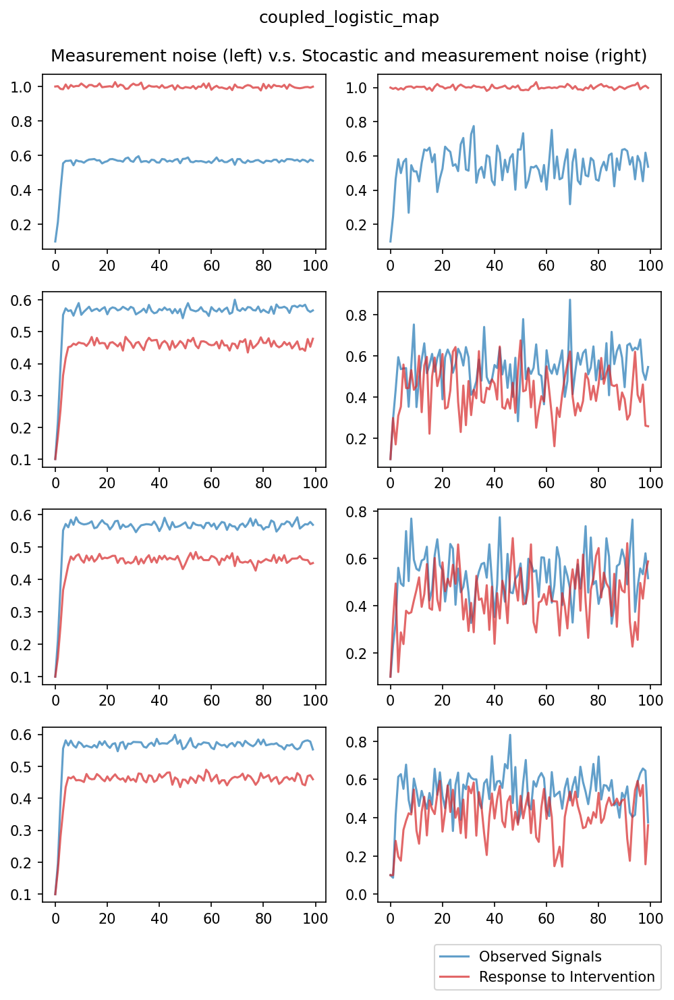

In [9]:
params = dict(
    model_type=interfere.dynamics.coupled_logistic_map,
    model_params={
        "adjacency_matrix": np.ones((4, 4)),
        "eps": 0.5,
        "logistic_param": 3.72,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.0},
    initial_condition_iter=[0.1 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

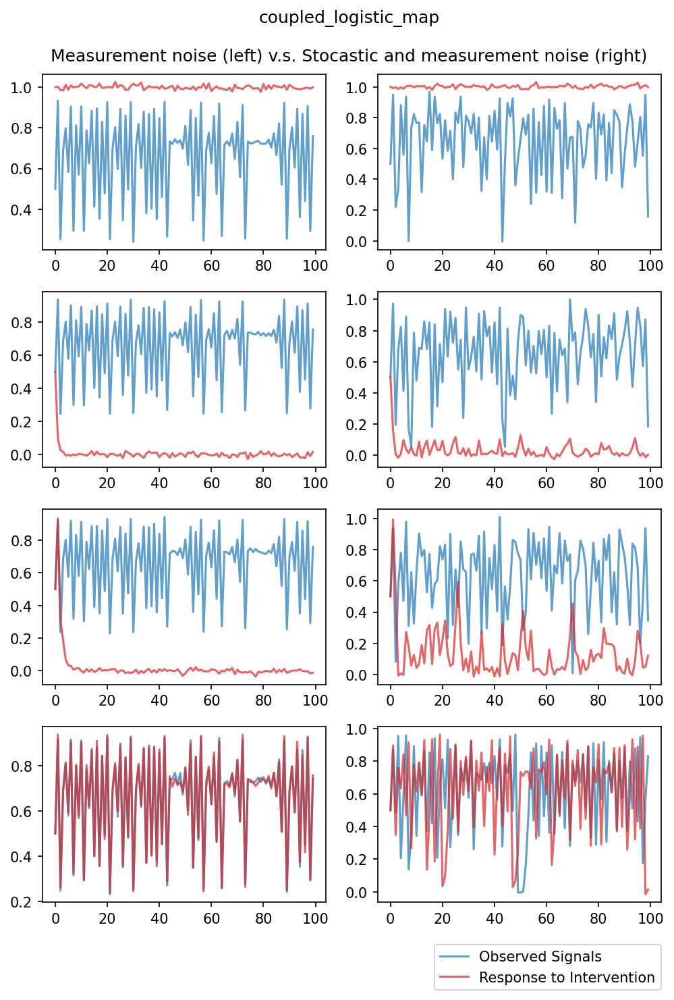

In [10]:
params = dict(
    model_type=interfere.dynamics.coupled_logistic_map,
    model_params={
        # Three cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "eps": 0.9,
        "logistic_param": 3.72,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.0},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

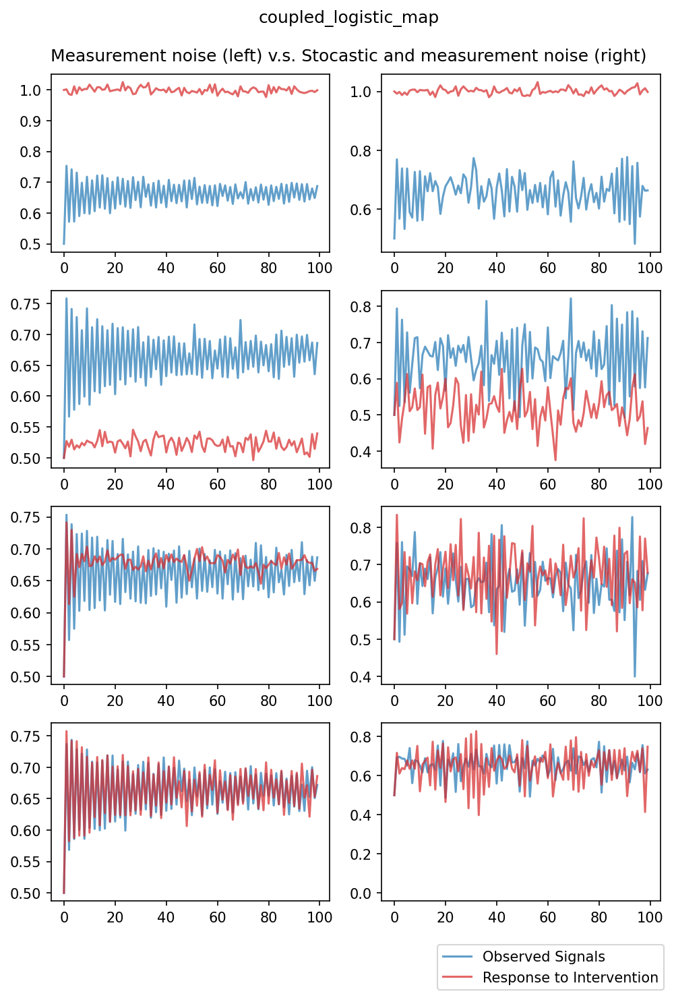

In [11]:
params = dict(
    model_type=interfere.dynamics.coupled_logistic_map,
    model_params={
        # Three cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "eps": 0.3,
        "logistic_param": 3.0,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 1.0},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Coupled Lattice Map (quadratic map)

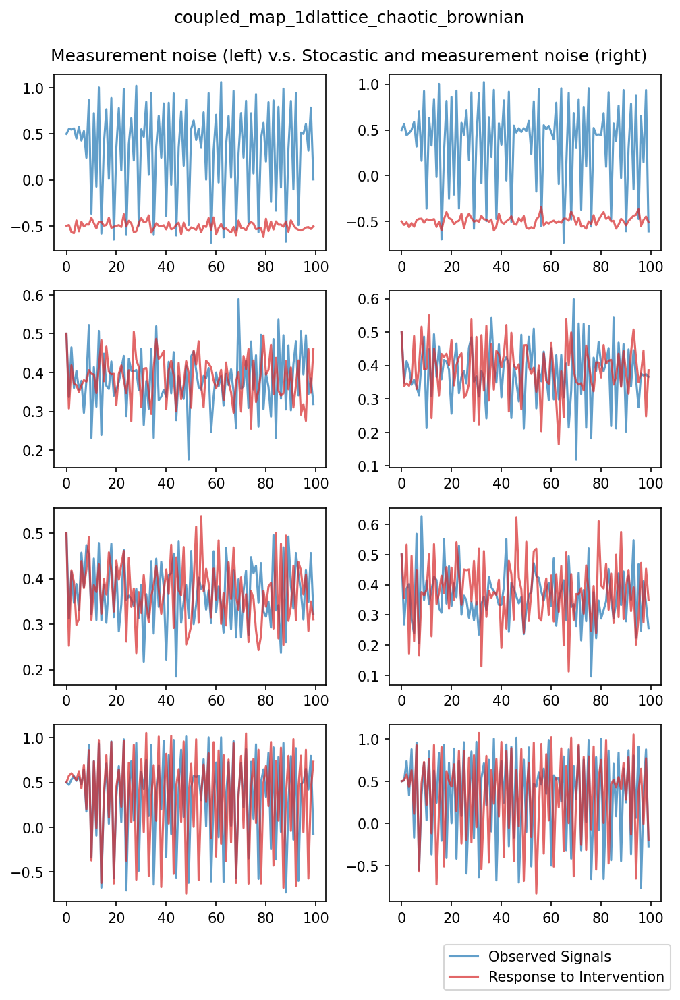

In [12]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_chaotic_brownian,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

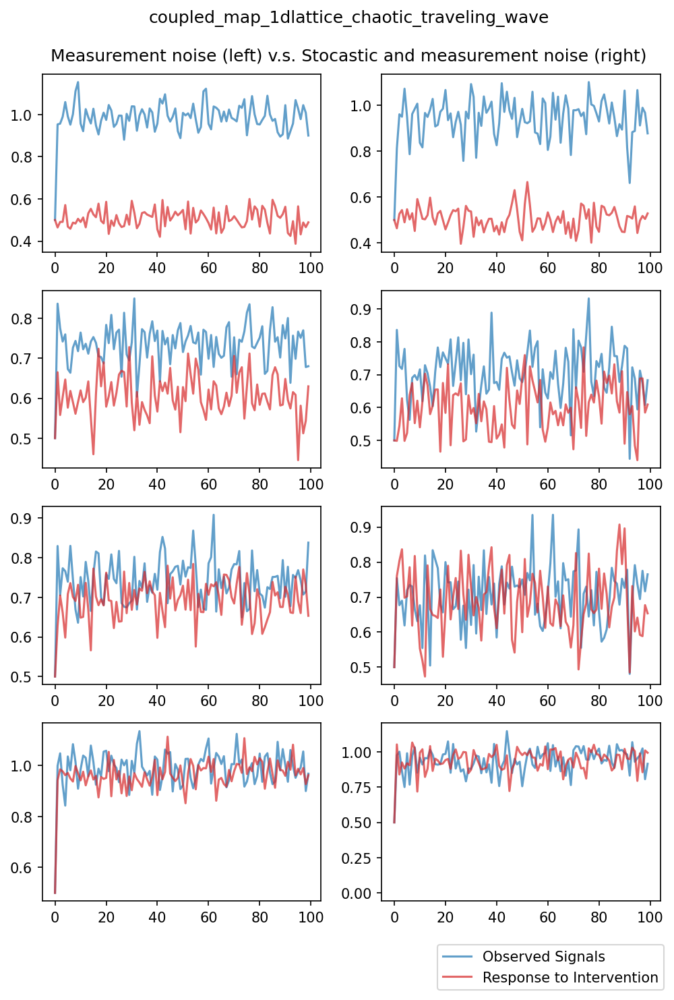

In [13]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_chaotic_traveling_wave,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

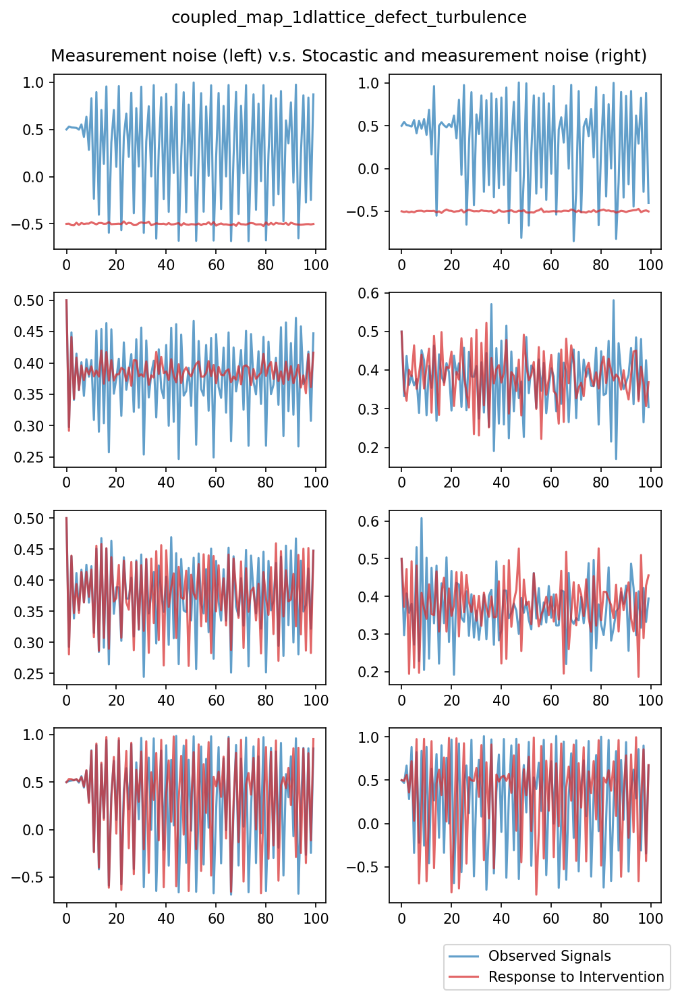

In [14]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_defect_turbulence,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.01 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

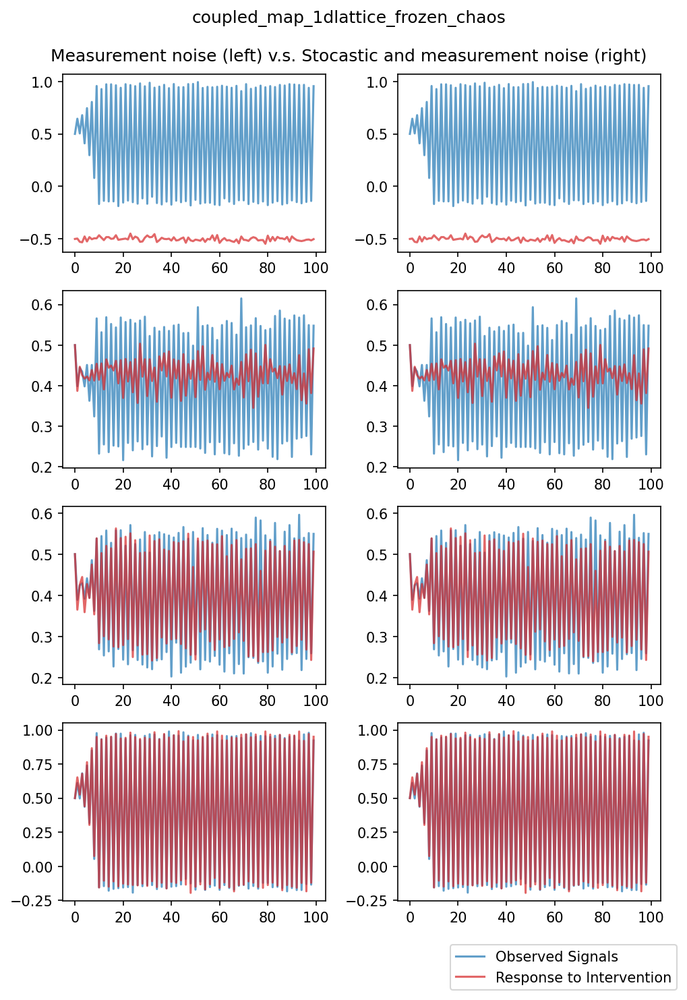

In [15]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_frozen_chaos,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.02 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

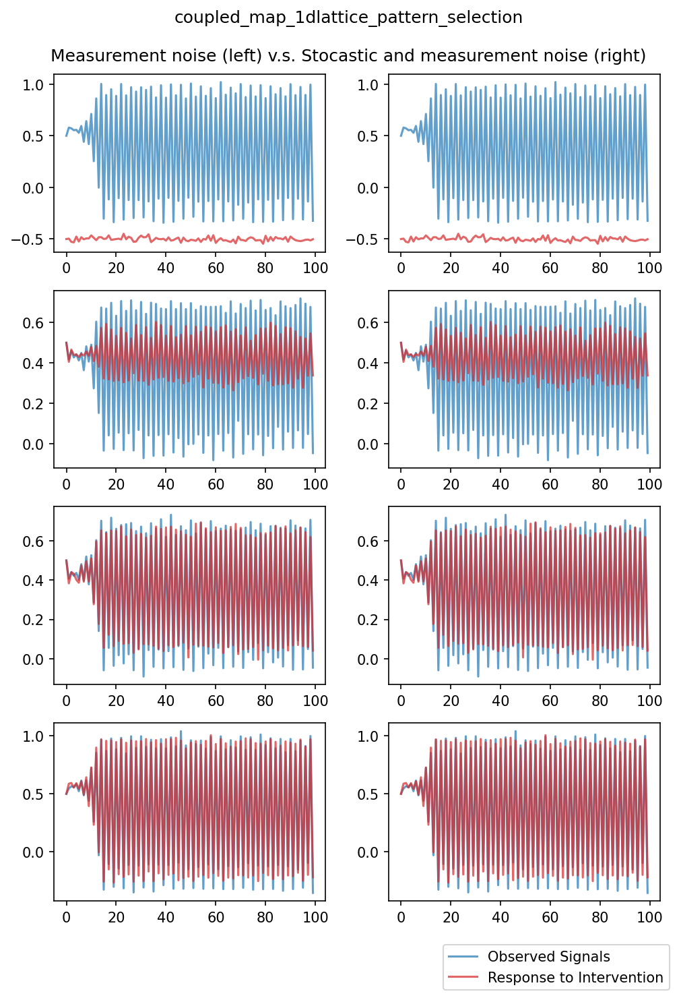

In [16]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_pattern_selection,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.02 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

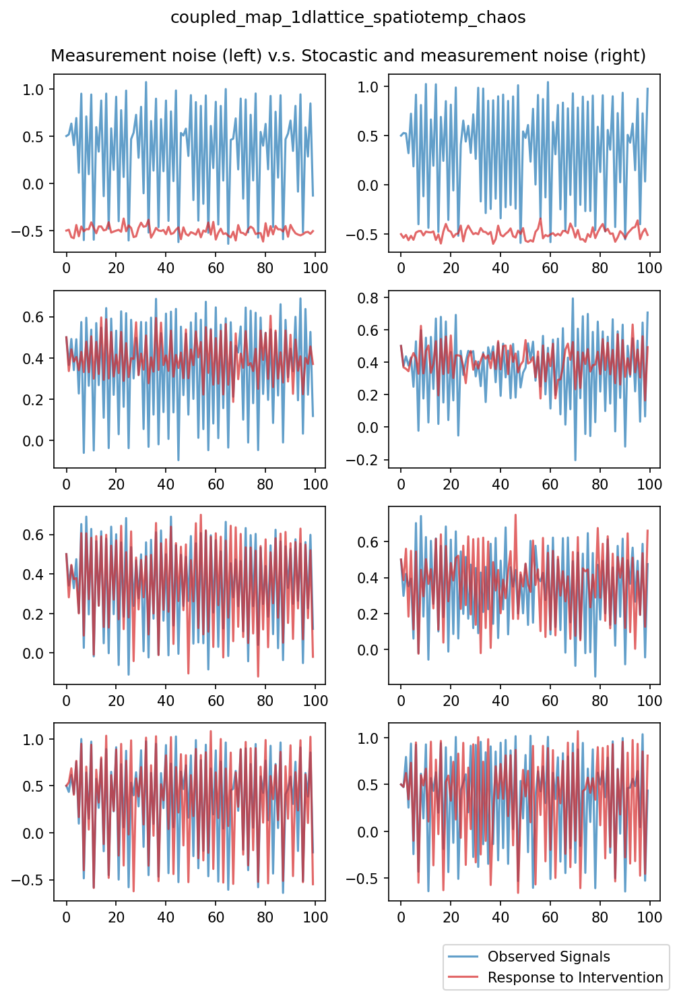

In [17]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_spatiotemp_chaos,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

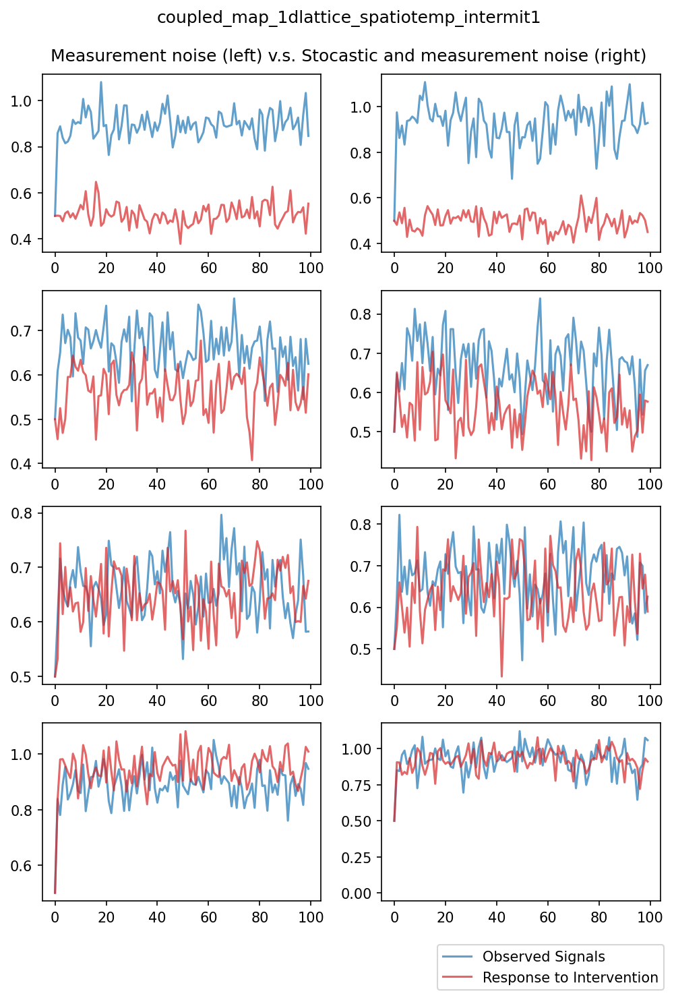

In [18]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_spatiotemp_intermit1,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

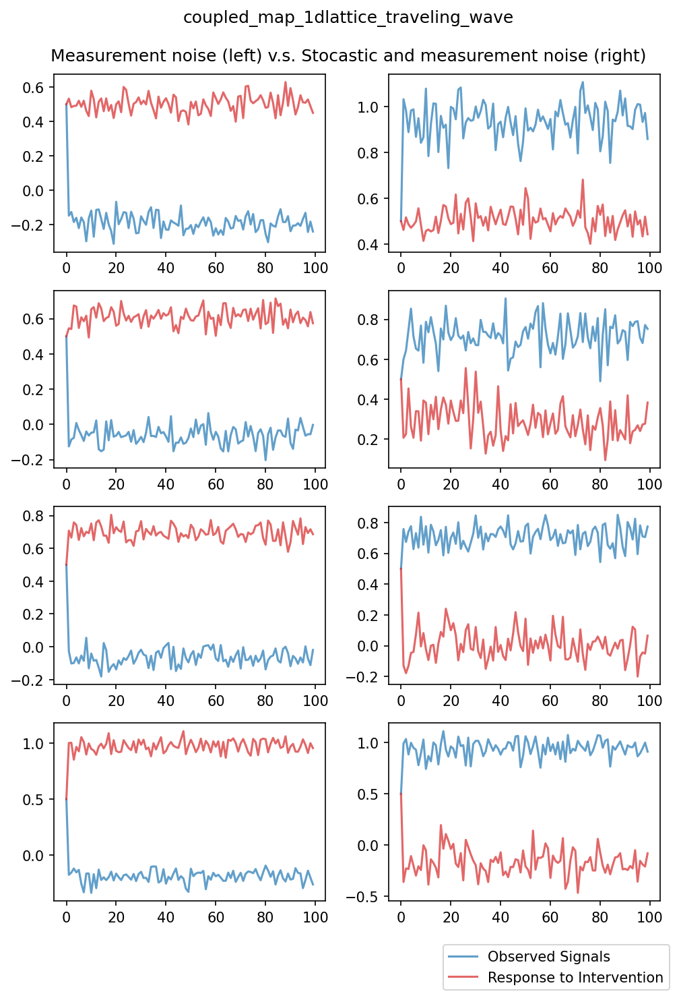

In [19]:
params = dict(
    model_type=interfere.dynamics.coupled_map_1dlattice_traveling_wave,
    model_params={
        "dim": 4,
        "sigma": 0.0,
        "measurement_noise_std": 0.05 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.arange(0, 100)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Damped Oscilator

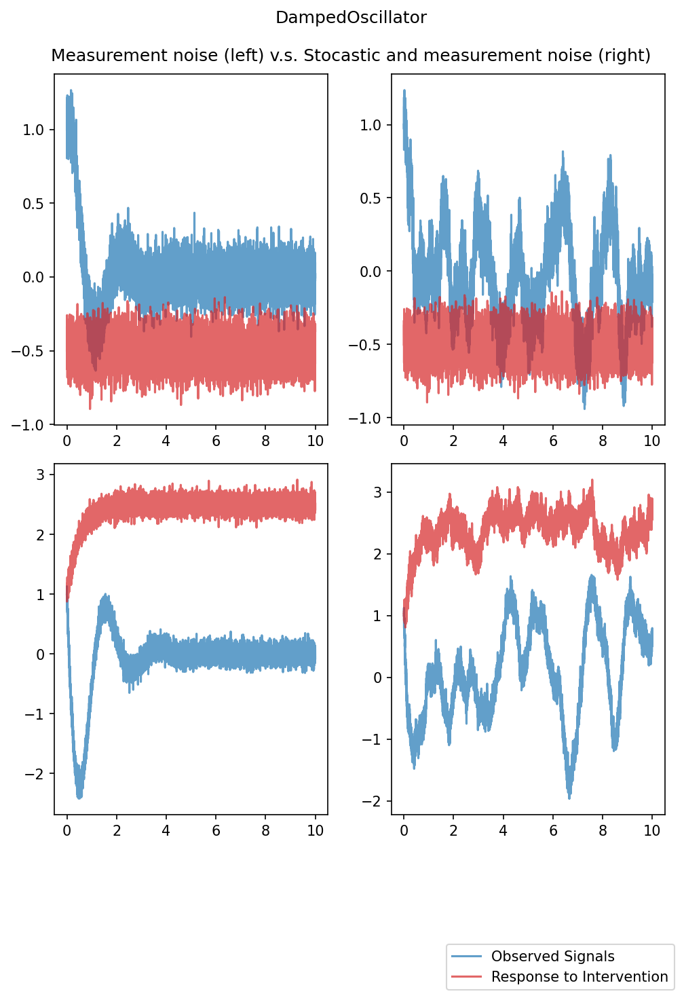

In [20]:
params = dict(
    model_type=interfere.dynamics.DampedOscillator,
    model_params={"m": 1.0, "c": 2, "k": 10, "sigma": 0,
                  "measurement_noise_std": 0.1 * np.ones(2)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[np.ones(2)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

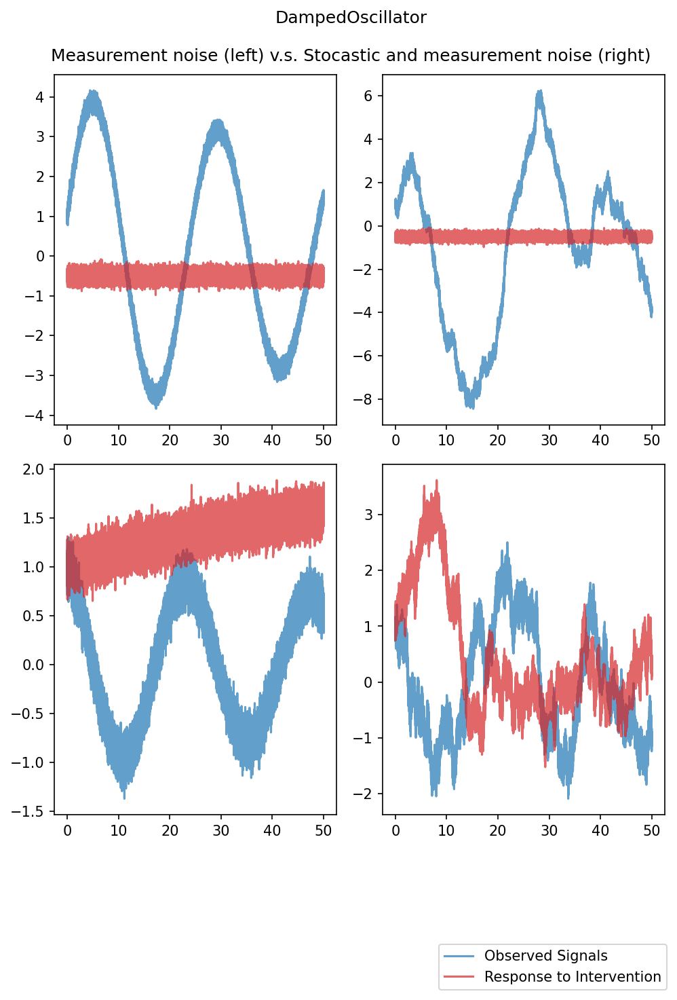

In [21]:
params = dict(
    model_type=interfere.dynamics.DampedOscillator,
    model_params={"m": 30.0, "c": 0.5, "k": 2, "sigma": 0,
                  "measurement_noise_std": 0.1 * np.ones(2)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[np.ones(2)],
    time_points_iter=[np.linspace(0, 50, 50_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Geometric Browian Motion

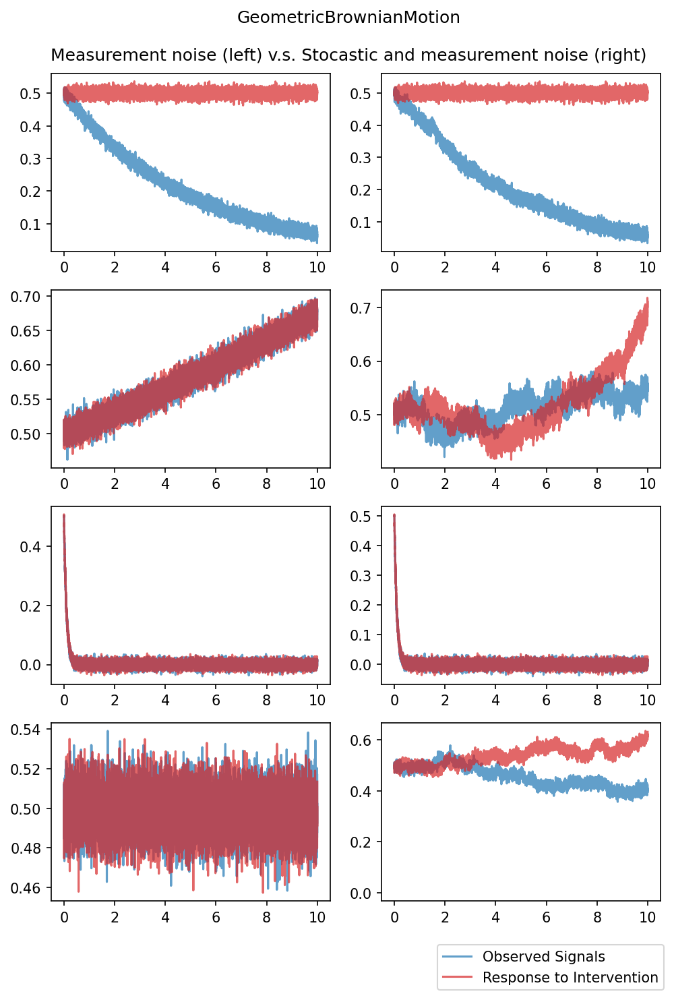

In [22]:
params = dict(
    model_type=interfere.dynamics.GeometricBrownianMotion,
    model_params={
        "mu": np.array([-0.2, 0.03, -10, -0.0007]),
        "sigma": np.zeros(4),
        "measurement_noise_std": 0.01 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.05 * np.ones(4)

plot_helper(params, noise_params)

all_params += [params, noise_params]

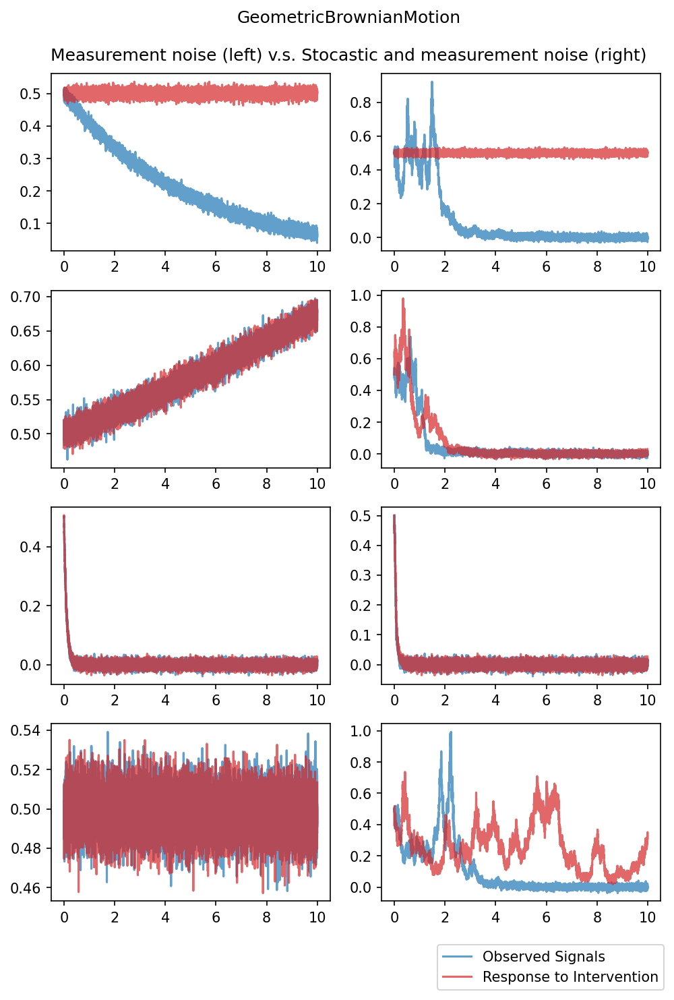

In [23]:
params = dict(
    model_type=interfere.dynamics.GeometricBrownianMotion,
    model_params={
        "mu": np.array([-0.2, 0.03, -10, -0.0007]),
        "sigma": np.zeros(4),
        "measurement_noise_std": 0.01 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    initial_condition_iter=[0.5 * np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = np.ones(4)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Hodgkin Huxley 

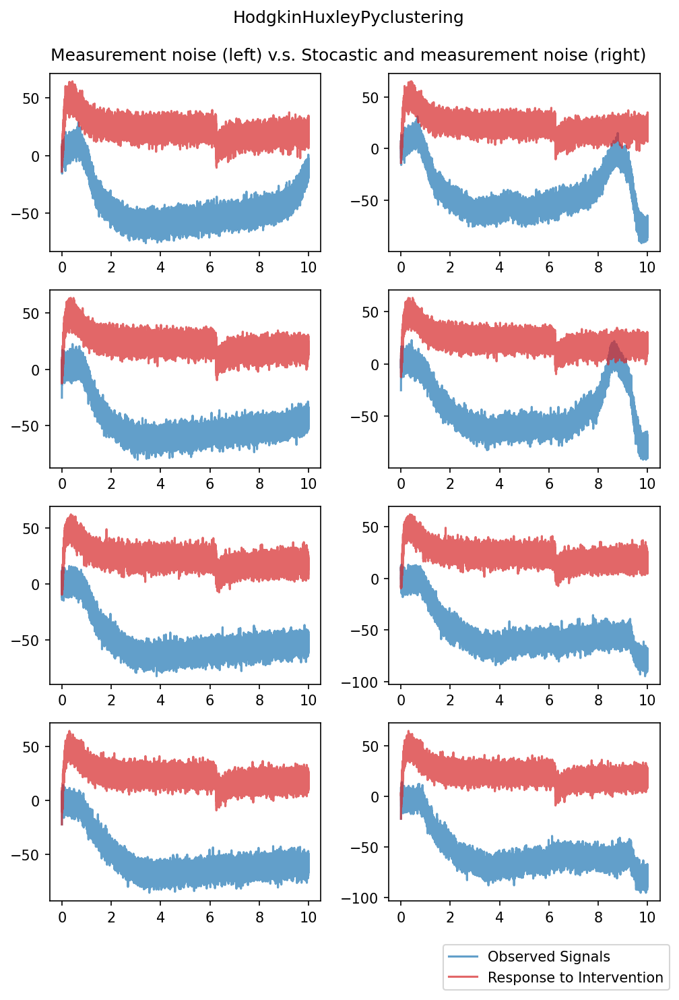

In [24]:
params = dict(
    model_type=interfere.dynamics.HodgkinHuxleyPyclustering,
    model_params={
        "stimulus": np.array([40, 30, 20, 10]),
        "sigma": np.zeros(4),
        "measurement_noise_std": 5 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 1, "constants": 10},
    initial_condition_iter=[-40 * np.random.rand(4)],
    time_points_iter=[np.linspace(0, 10, 25_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 5 * np.ones(4)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Imaginary Roots 4D

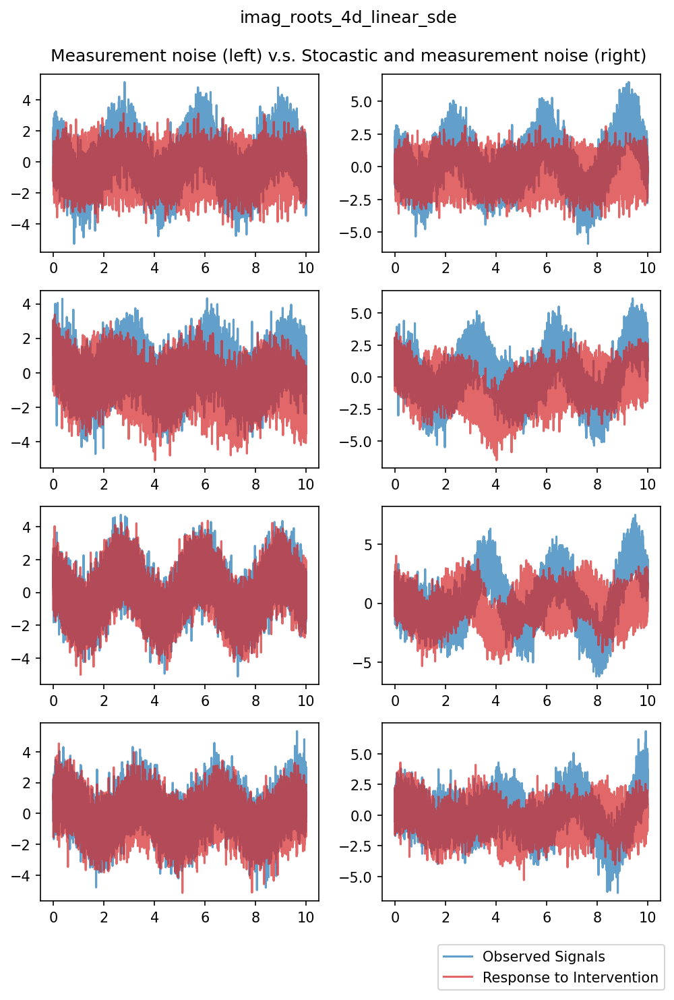

In [25]:
params = dict(
    model_type=interfere.dynamics.imag_roots_4d_linear_sde,
    model_params={"sigma": 0,
                  "measurement_noise_std": np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Kuramoto Oscilators

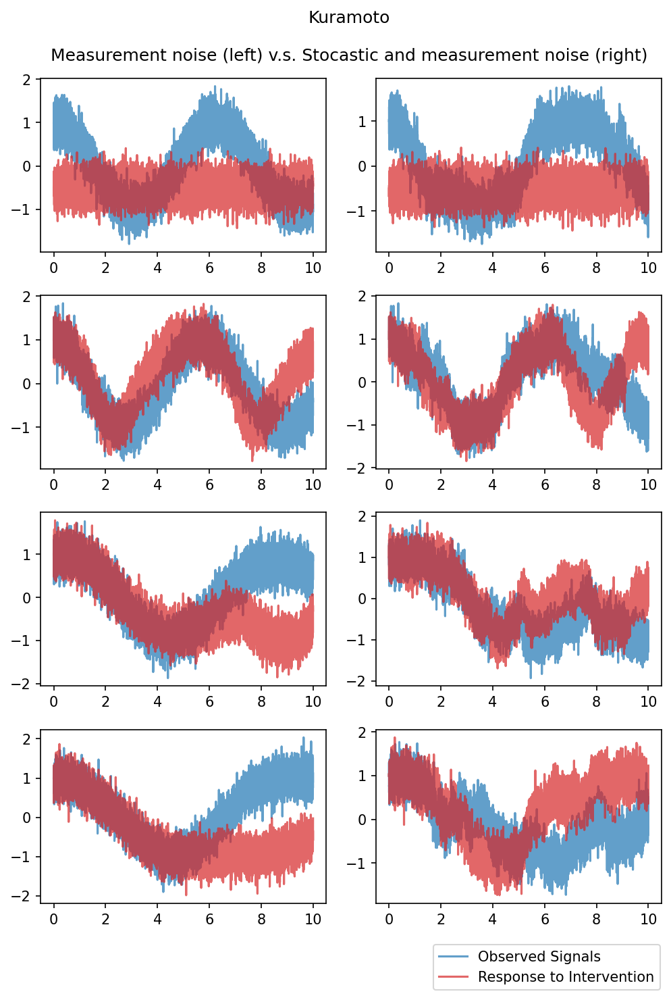

In [26]:
params = dict(
    model_type=interfere.dynamics.Kuramoto,
    model_params={
        "omega": np.array([1.0, 1.3, 0.2, 0.7]),
        "K": 2.5,
        # A chain network
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

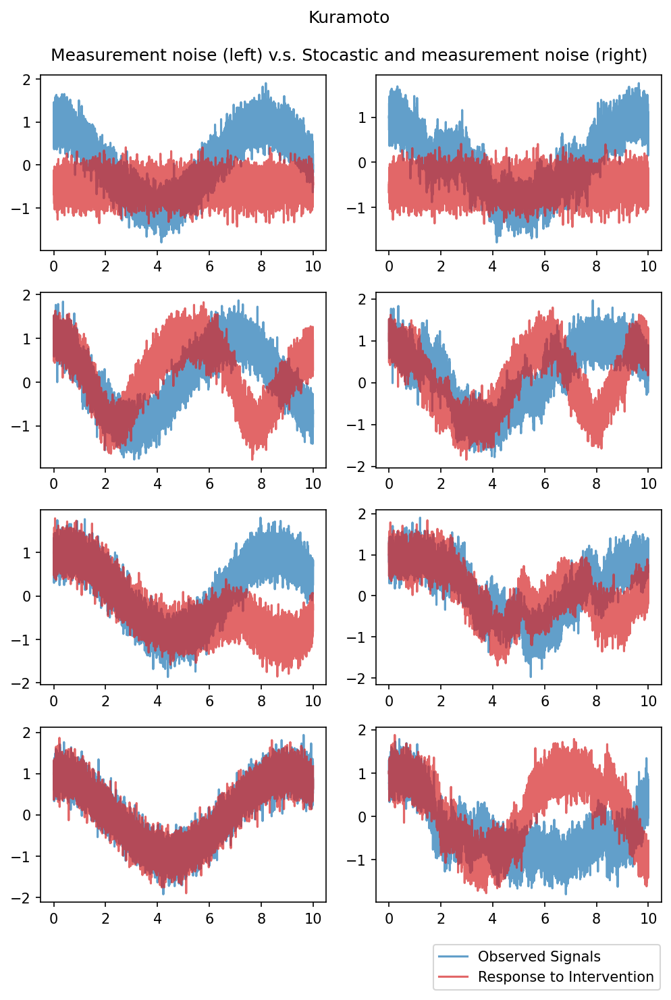

In [27]:
params = dict(
    model_type=interfere.dynamics.Kuramoto,
    model_params={
        "omega": np.array([1.0, 1.3, 0.2, 0.7]),
        "K": 2.5,
        # Three cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

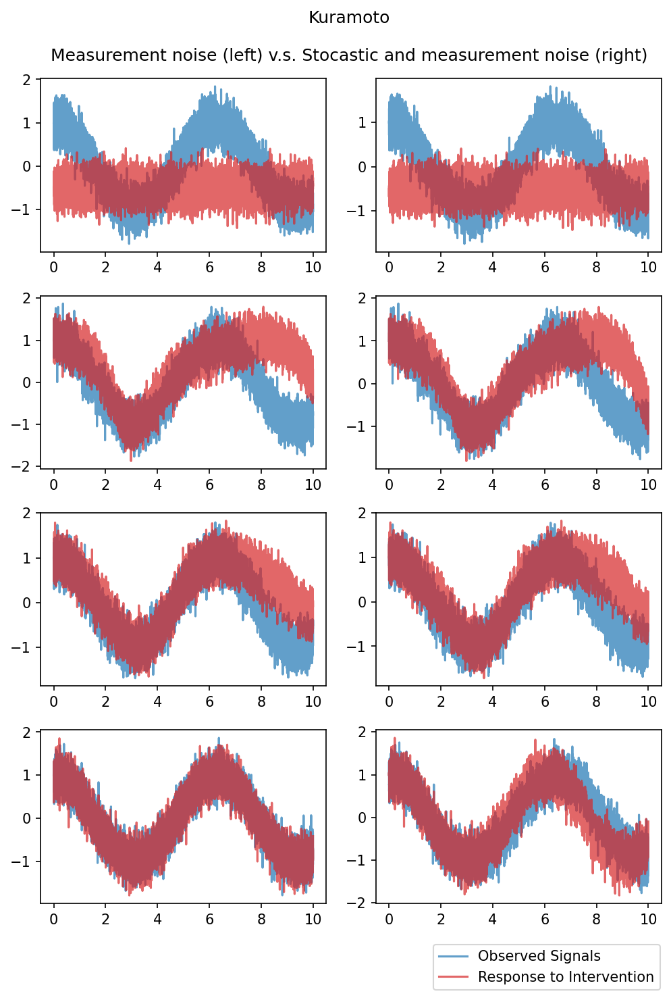

In [28]:
params = dict(
    model_type=interfere.dynamics.Kuramoto,
    model_params={
        # All nodes have the same fundamental frequency
        "omega": np.ones(4),
        "K": 2.5,
        # Three cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Kuramoto-Sakaguchi

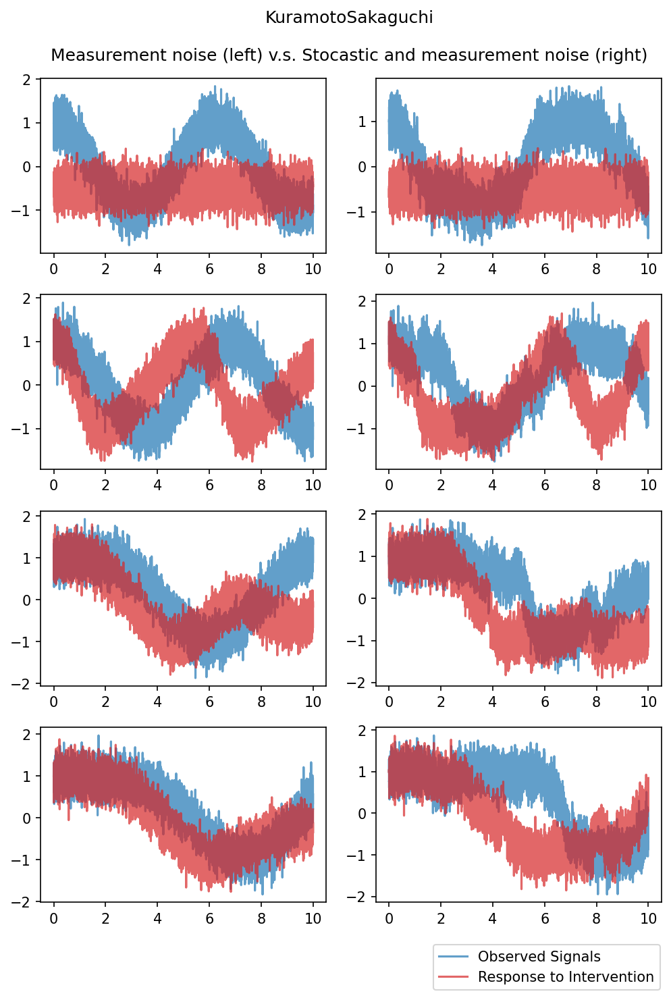

In [29]:
params = dict(
    model_type=interfere.dynamics.KuramotoSakaguchi,
    model_params={
        "omega": np.array([1.0, 1.3, 0.2, 0.7]),
        "K": 2.5,
        # A chain network
        "adjacency_matrix": np.array([
            [0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0],
        ]),
        "phase_frustration": np.array([
            [0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

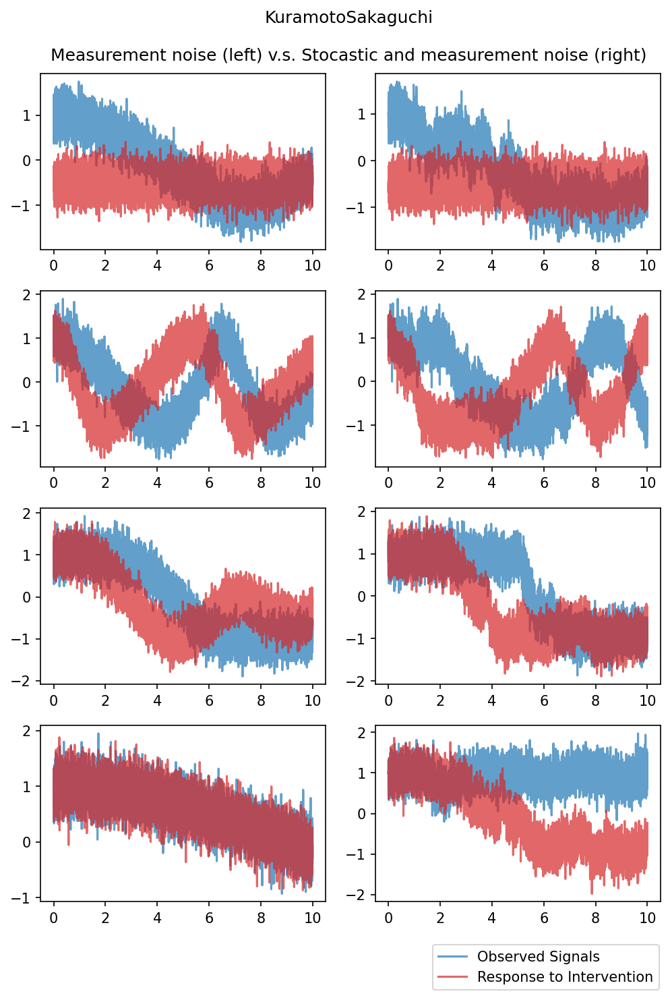

In [30]:
params = dict(
    model_type=interfere.dynamics.KuramotoSakaguchi,
    model_params={
        "omega": np.array([1.0, 1.3, 0.2, 0.7]),
        "K": 2.5,
        # Three cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "phase_frustration": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

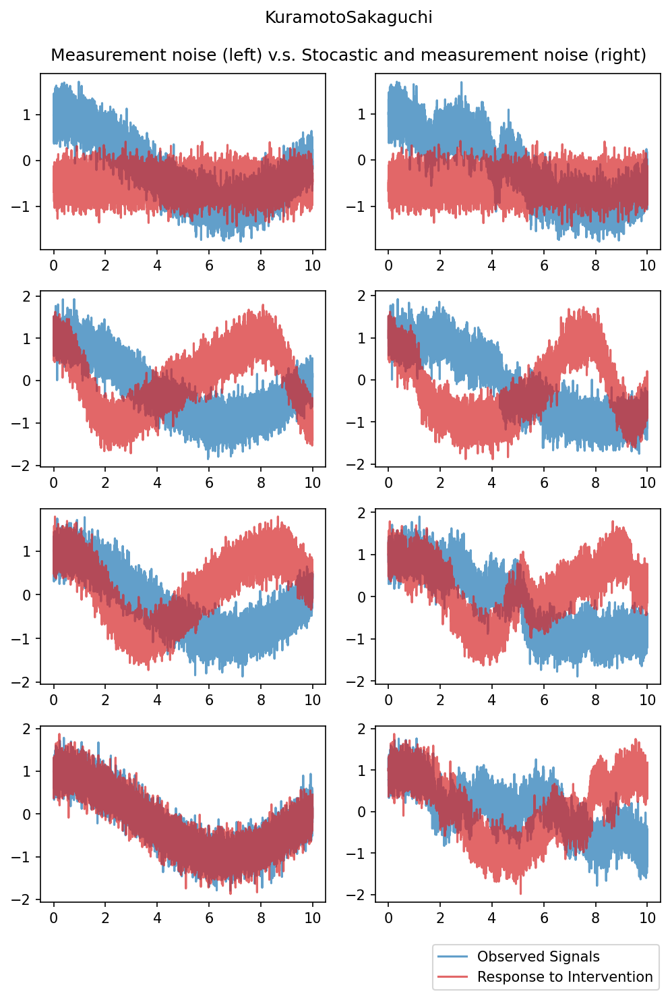

In [31]:
params = dict(
    model_type=interfere.dynamics.KuramotoSakaguchi,
    model_params={
        # All nodes have the same fundamental frequency
        "omega": np.ones(4),
        "K": 2.5,
        # Three cycle and isolated node
        "adjacency_matrix": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "phase_frustration": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.5},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Liping Finance Model

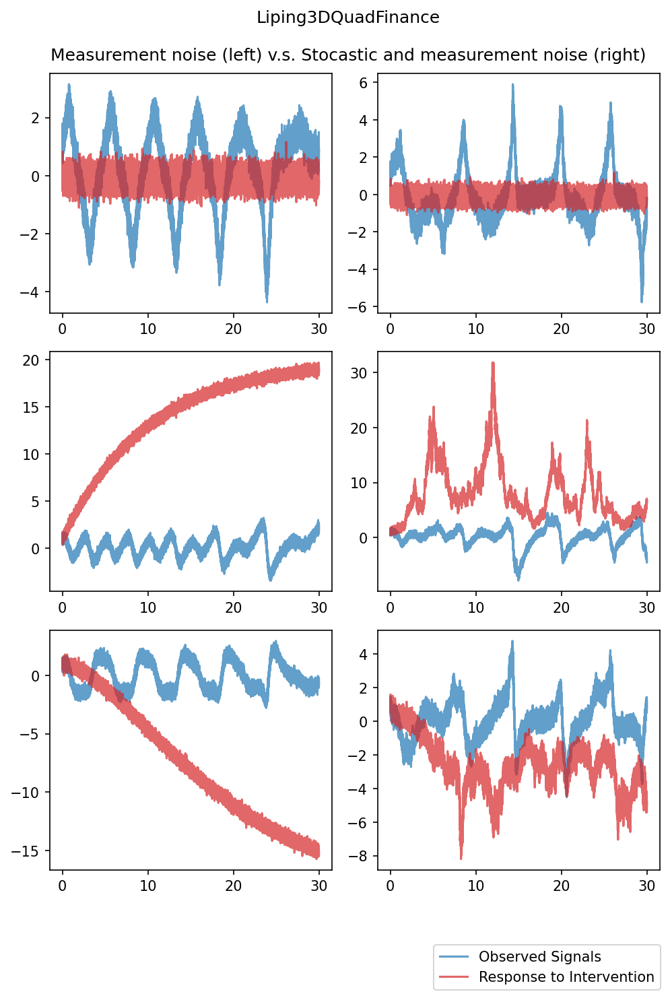

In [32]:
params = dict(
    model_type=interfere.dynamics.Liping3DQuadFinance,
    model_params={
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(3)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": -0.1},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(3)],
    time_points_iter=[np.linspace(0, 30, 30_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Lotka Voltera

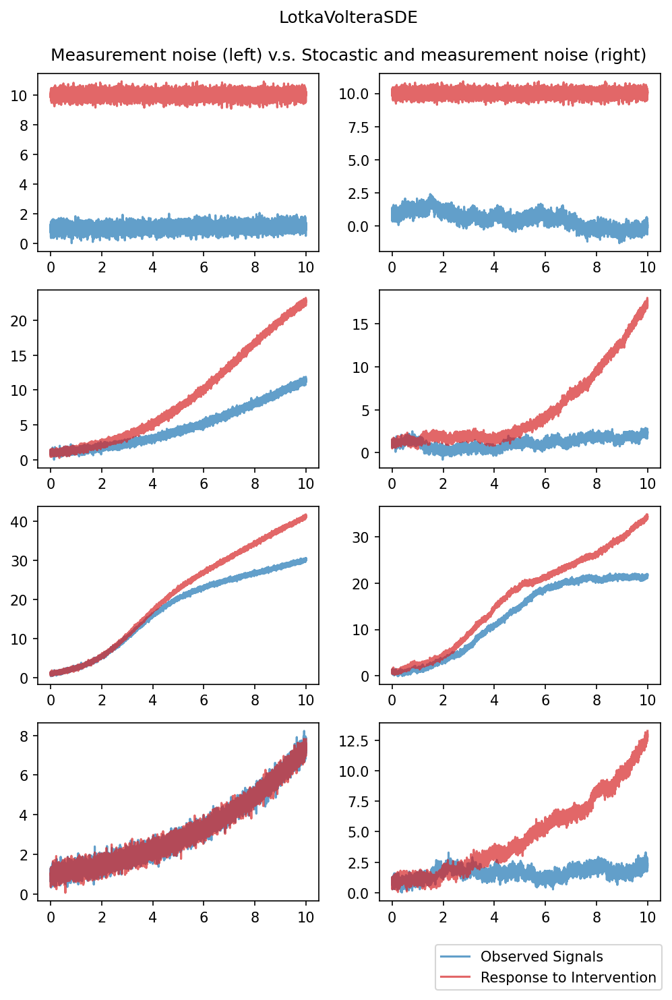

In [33]:
params = dict(
    model_type=interfere.dynamics.LotkaVolteraSDE,
    model_params={
        "growth_rates": np.array([0.01, 0.3, 0.9, 0.2]),
        "capacities": 20 * np.ones(4),
        # Three cycle and isolated node
        "interaction_mat": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 10.0},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.5

plot_helper(params, noise_params)

all_params += [params, noise_params]

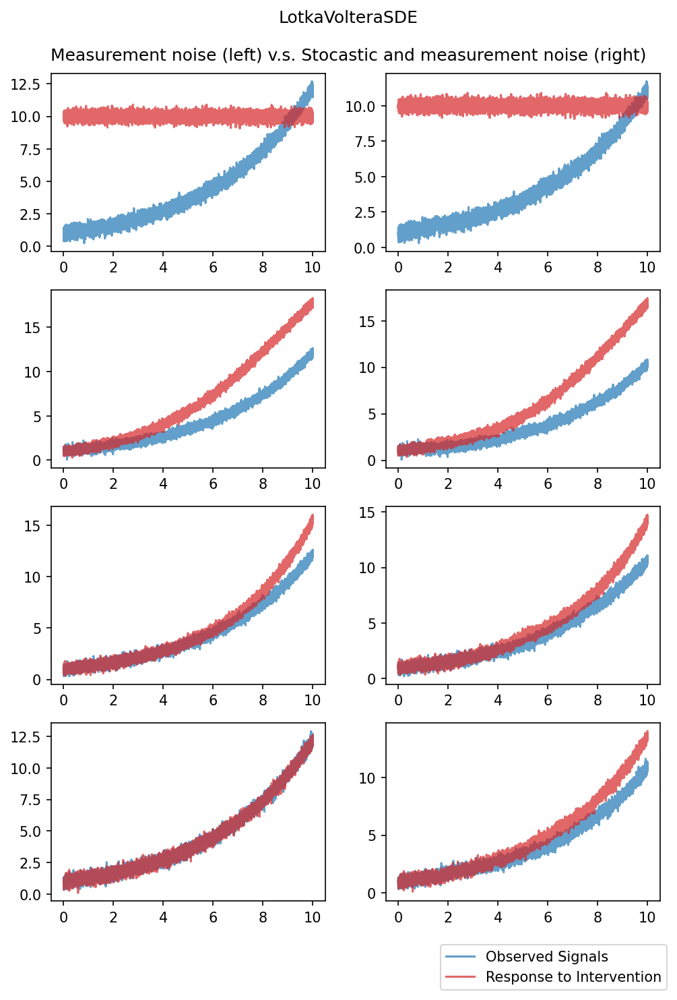

In [34]:
params = dict(
    model_type=interfere.dynamics.LotkaVolteraSDE,
    model_params={
        # All nodes have the same fundamental frequency
        "growth_rates": np.array([0.25, 0.25, 0.25, 0.25]),
        "capacities": 20 * np.ones(4),
        # Three cycle and isolated node
        "interaction_mat": np.array([
            [0.0, 0.0, 1.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 0.0, 1.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    intervention_params={"intervened_idxs": 0, "constants": 10.0},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

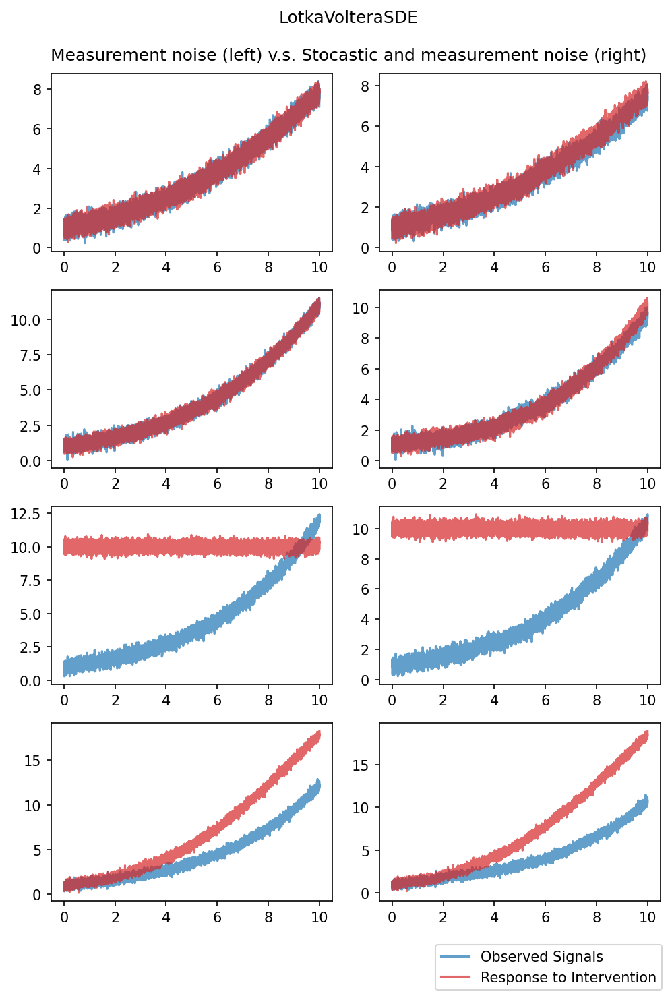

In [35]:
params = dict(
    model_type=interfere.dynamics.LotkaVolteraSDE,
    model_params={
        # All nodes have the same fundamental frequency
        "growth_rates": np.array([0.25, 0.25, 0.25, 0.25]),
        "capacities": 20 * np.ones(4),
        # Chain
        "interaction_mat": np.array([
            [0.0, 0.0, 0.0, 0.0],
            [1.0, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, 0.0],
            [0.0, 0.0, 1.0, 0.0],
        ]),
        "sigma": 0,
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 10.0},
    # Nodes begin synchronized but the intervention reveals coupling.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = 0.1

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Ornstein Uhlenbeck

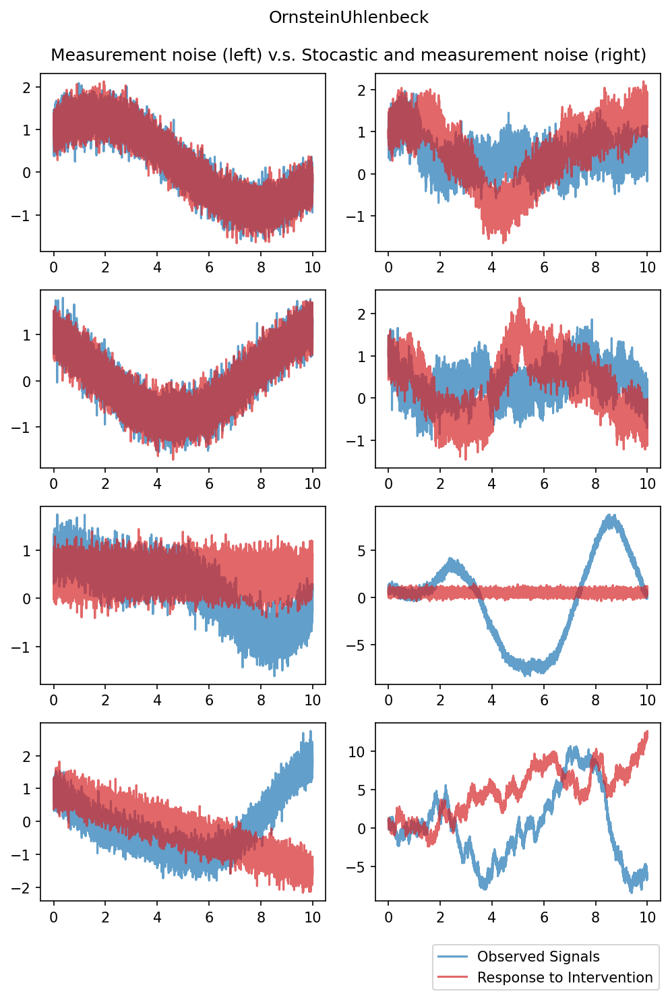

In [36]:
params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": np.array([0.25, 0.25, 0.25, 0.25]),
        # Chain
        "theta": np.array([
            [0.0, -.5, 0.0, 0.0],
            [0.5, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, -1],
            [0.0, 0.0, 1.0, 0.0],
        ]),
        "Sigma": np.zeros((4, 4)),
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = np.array([
    [0.0, 0.3, 0.0, 0.0],
    [-.3, 0.0, 0.3, 0.0],
    [0.0, -.3, 0.0, 0.0],
    [0.0, 0.0, 0.0, 3.0],
])

plot_helper(params, noise_params)

all_params += [params, noise_params]

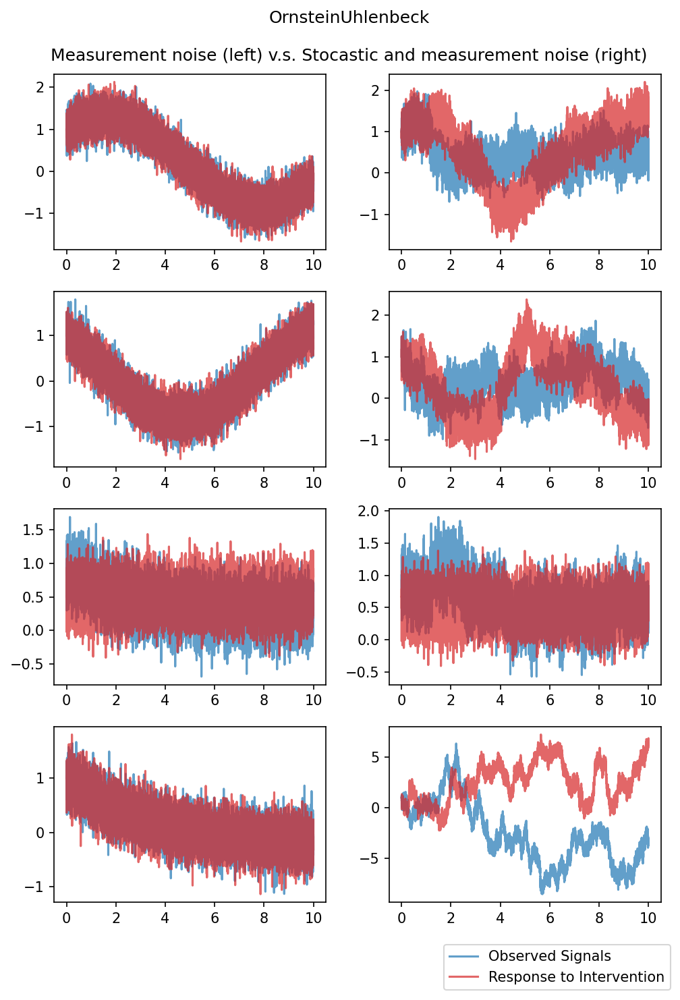

In [37]:
params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": np.array([0.25, 0.25, 0.25, -0.25]),
        # Chain
        "theta": np.array([
            [0.0, -.5, 0.0, 0.0],
            [0.5, 0.0, 0.0, 0.0],
            [0.0, 0.0, 0.5, 0.0],
            [0.0, 0.0, 0.0, 0.3],
        ]),
        "Sigma": np.zeros((4, 4)),
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = np.array([
    [0.0, 0.3, 0.0, 0.0],
    [-.3, 0.0, 0.3, 0.0],
    [0.0, -.3, 0.0, 0.0],
    [0.0, 0.0, 0.0, 3.0],
])

plot_helper(params, noise_params)

all_params += [params, noise_params]

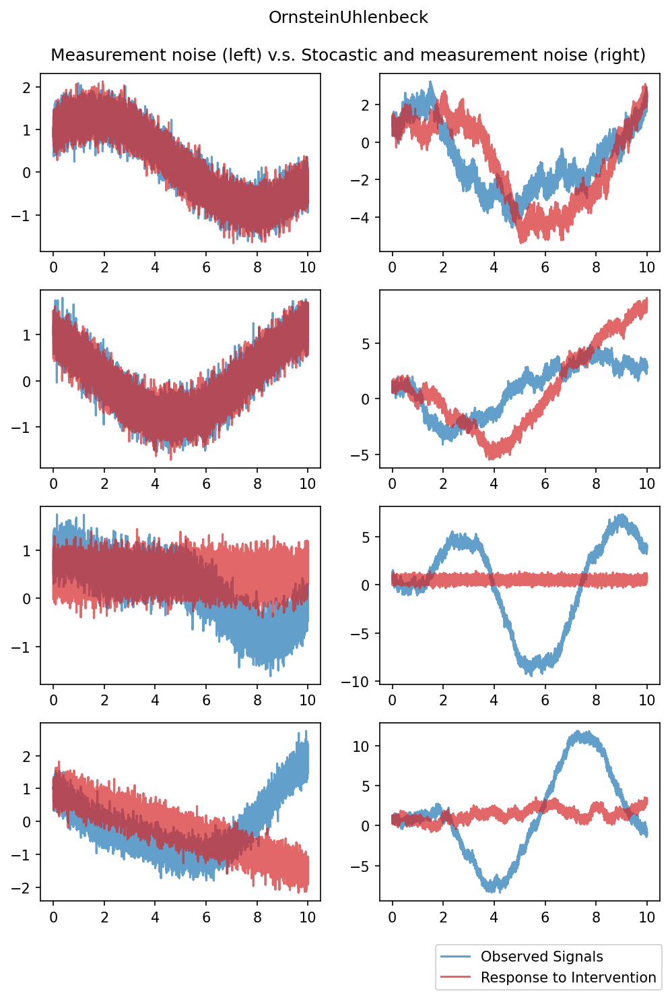

In [38]:
params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": np.array([0.25, 0.25, 0.25, 0.25]),
        # Chain
        "theta": np.array([
            [0.0, -.5, 0.0, 0.0],
            [0.5, 0.0, 0.0, 0.0],
            [0.0, 1.0, 0.0, -1],
            [0.0, 0.0, 1.0, 0.0],
        ]),
        "Sigma": np.zeros((4, 4)),
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = np.eye(4)

plot_helper(params, noise_params)

all_params += [params, noise_params]

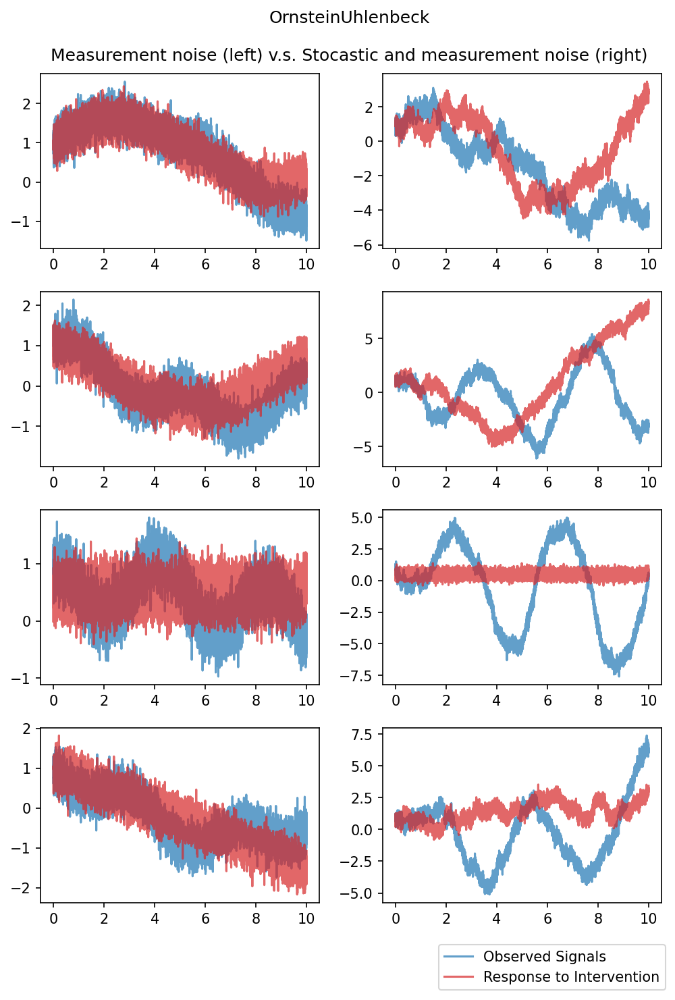

In [39]:
params = dict(
    model_type=interfere.dynamics.OrnsteinUhlenbeck,
    model_params={
        "mu": np.array([0.25, 0.25, 0.25, 0.25]),
        # Chain
        "theta": np.array([
            [0.0, -.5, 0.0, 0.0],
            [0.5, 0.0, -1.0, 0.0],
            [0.0, 1.0, 0.0, -1],
            [0.0, 0.0, 1.0, 0.0],
        ]),
        "Sigma": np.zeros((4, 4)),
        "measurement_noise_std": 0.25 * np.ones(4)},
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(1)
)

noise_params = deepcopy(params)
noise_params["model_params"]["Sigma"] = np.eye(4)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Uncorrelated Noise

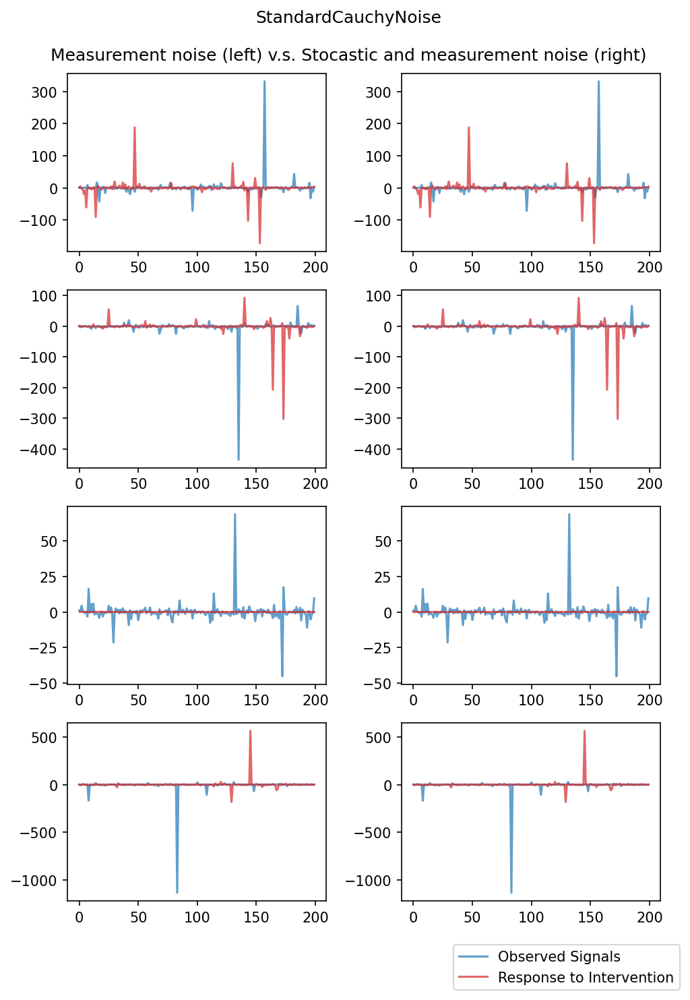

In [40]:
params = dict(
    model_type=interfere.dynamics.StandardCauchyNoise,
    model_params={
        "dim": 4,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.arange(200)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

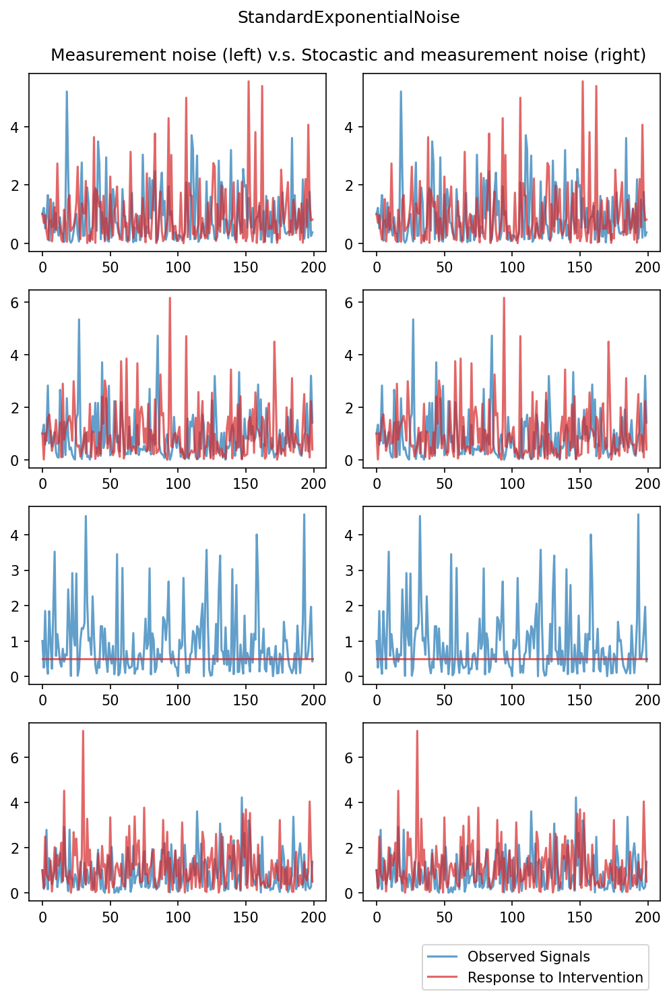

In [41]:
params = dict(
    model_type=interfere.dynamics.StandardExponentialNoise,
    model_params={
        "dim": 4,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.arange(200)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

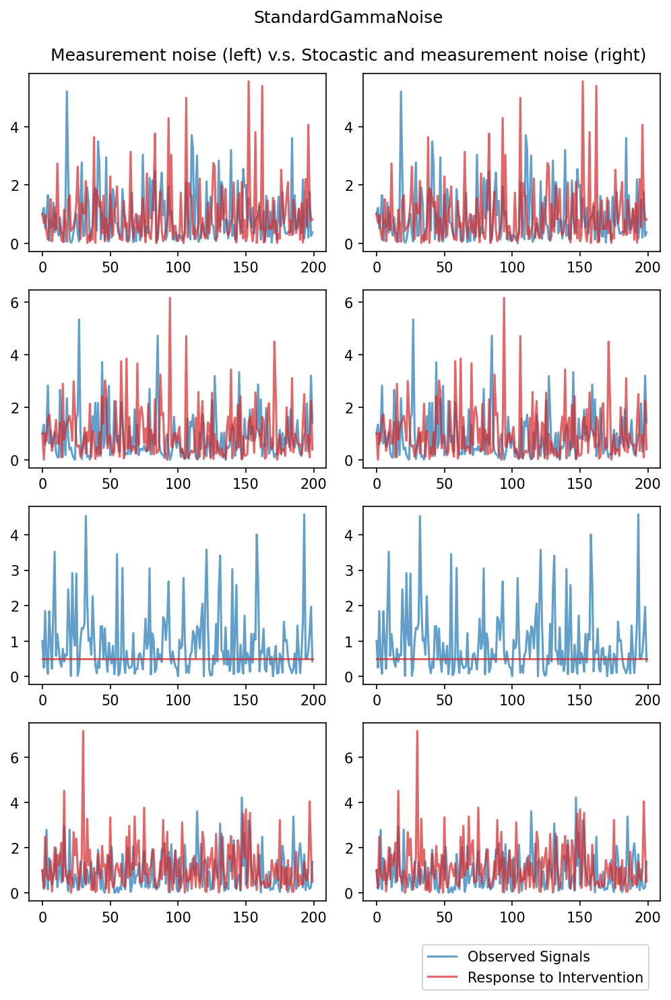

In [42]:
params = dict(
    model_type=interfere.dynamics.StandardGammaNoise,
    model_params={
        "dim": 4,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.arange(200)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

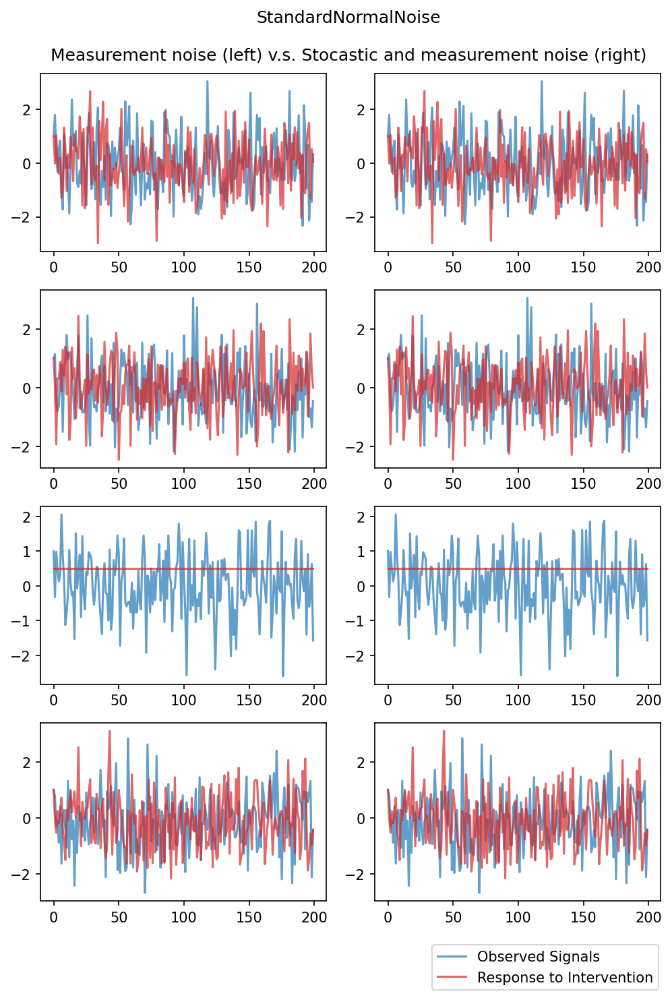

In [43]:
params = dict(
    model_type=interfere.dynamics.StandardNormalNoise,
    model_params={
        "dim": 4,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.arange(200)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

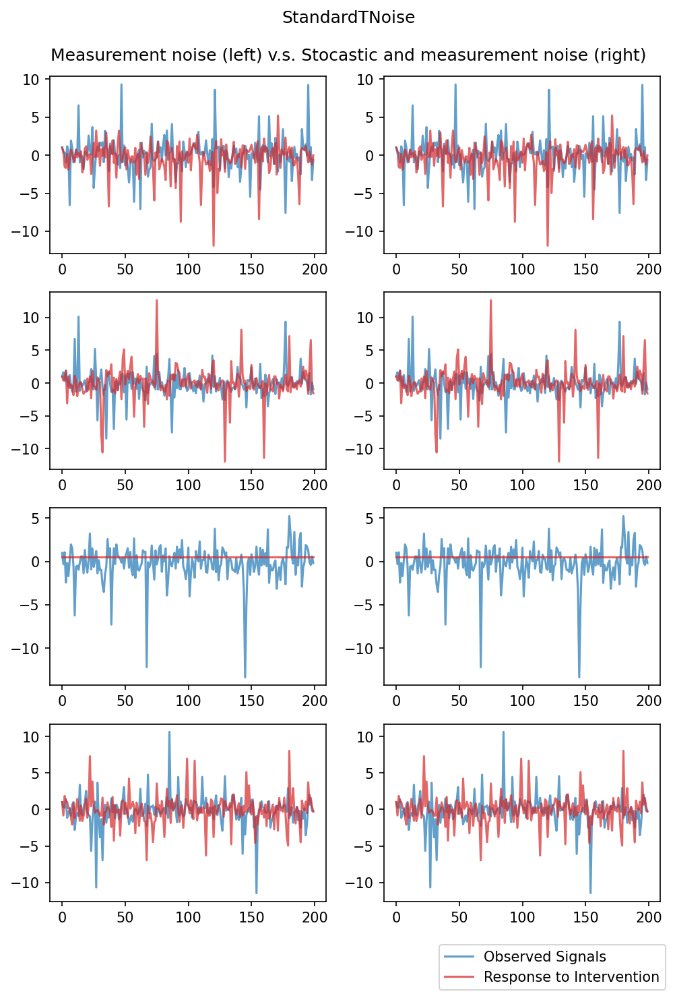

In [44]:
params = dict(
    model_type=interfere.dynamics.StandardTNoise,
    model_params={
        "dim": 4,
        "measurement_noise_std": None,
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.arange(200)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### Stuart-Landau-Kuramoto

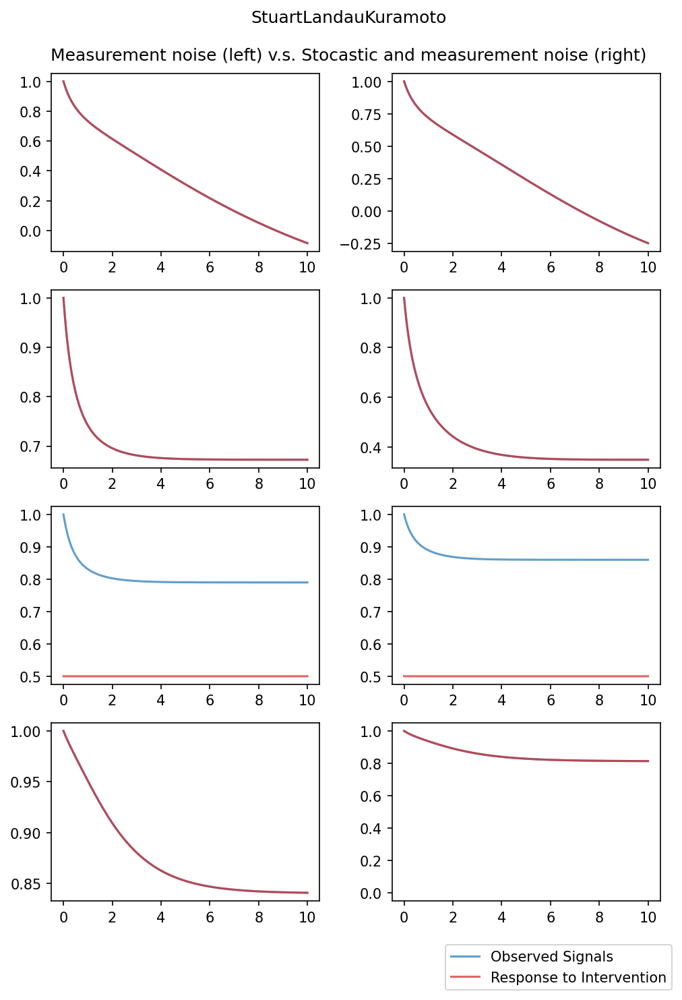

In [45]:
params = dict(
    model_type=interfere.dynamics.StuartLandauKuramoto,
    model_params={
        "omega": np.array([0.3, 0.1, 1.2, 0.9]),
        "rho": np.array([1, 1, 2, 2]),
        "K": 2.7,
        "type_conn": "grid_four",
        "measurement_noise_std": 0.05 * np.zeros(4),
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 2, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones(4)],
    time_points_iter=[np.linspace(0, 10, 10_000)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)

plot_helper(params, noise_params)

all_params += [params, noise_params]

### VARMA Models

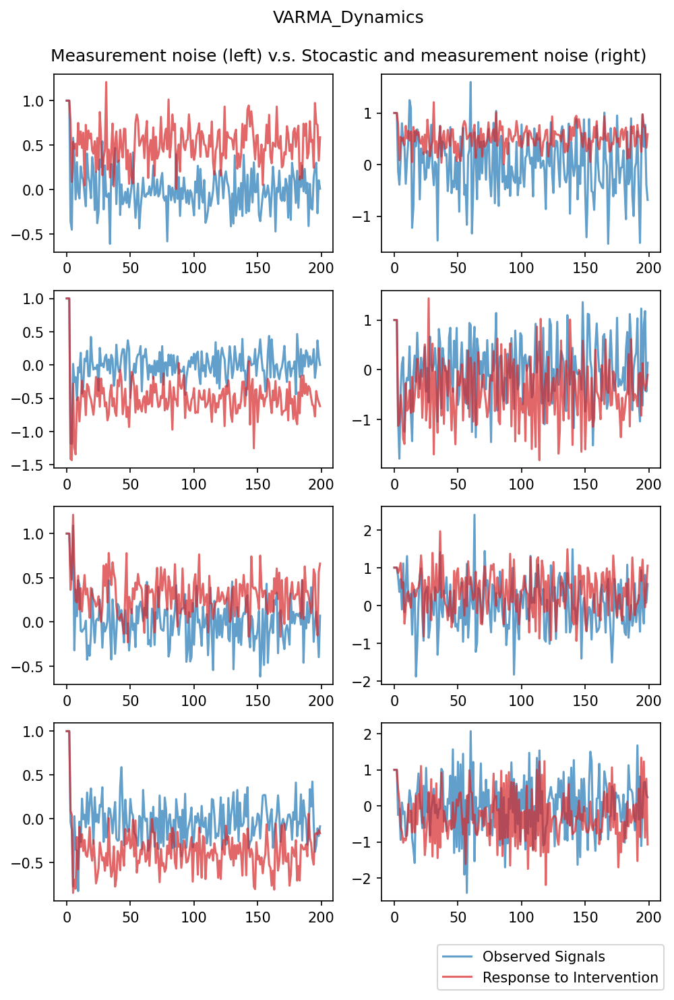

In [58]:
rng = np.random.default_rng(3)
phi_matrices = [rng.random((4,4)) - 0.5 for i in range(2)]
theta_matrices = [rng.random((4, 4)) - 0.5 for i in range(3)]
Sigma = rng.random((4,4)) / 4
Sigma = Sigma @ Sigma.T

params = dict(
    model_type=interfere.dynamics.VARMA_Dynamics,
    model_params={
        "phi_matrices": phi_matrices,
        "theta_matrices": theta_matrices,
        "sigma": np.zeros((4, 4)),
        "measurement_noise_std": 0.2 * np.ones(4),
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 0, "constants": 0.5},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones((3, 4))],
    time_points_iter=[np.arange(200)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = Sigma

plot_helper(params, noise_params)

all_params += [params, noise_params]

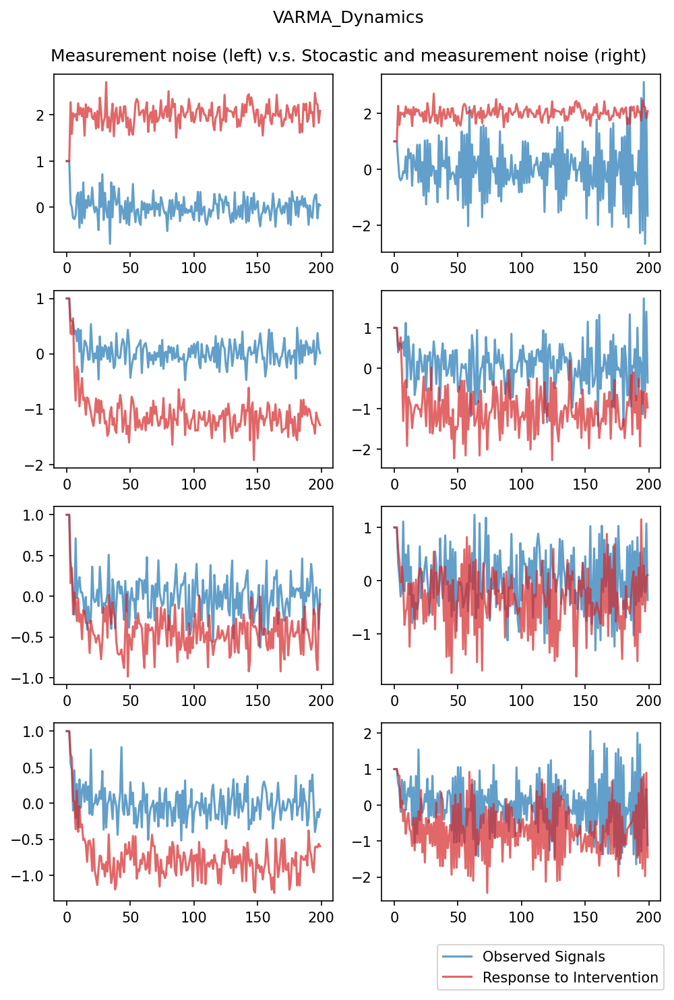

In [56]:
rng = np.random.default_rng(10)
phi_matrices = [rng.random((4,4)) - 0.5 for i in range(2)]
theta_matrices = [rng.random((4, 4)) - 0.5 for i in range(3)]
Sigma = rng.random((4,4)) / 4
Sigma = Sigma @ Sigma.T

params = dict(
    model_type=interfere.dynamics.VARMA_Dynamics,
    model_params={
        "phi_matrices": phi_matrices,
        "theta_matrices": theta_matrices,
        "sigma": np.zeros((4, 4)),
        "measurement_noise_std": 0.2 * np.ones(4),
    },
    intervention_type=interfere.PerfectIntervention,
    # Intervene on node further down the chain
    intervention_params={"intervened_idxs": 0, "constants": 2.0},
    # Nodes begin synchronized.
    initial_condition_iter=[np.ones((3, 4))],
    time_points_iter=[np.arange(200)],
    rng = np.random.default_rng(2)
)

noise_params = deepcopy(params)
noise_params["model_params"]["sigma"] = Sigma

plot_helper(params, noise_params)

all_params += [params, noise_params]